In [18]:
import pandas as pd
df = pd.read_pickle("./tes.pkl")  

In [19]:
prev_cols=['id',
 'advertType',
 'title',
 'Price_pm',
 'Price',
 'Area',
 'Rooms_num',
 'condition',#['TO_RENOVATION', 'READY_TO_USE', 'TO_COMPLETION', nan] 
 'Build_year', 
 'Floor_no',
 'Building_floors_num',
 'streetname', 
 'district',
 'residential',]

# ZWYKLE
c1=df['MY_Building_type']=='block' #20%bez kategorii
c2=df['Price_pm']>5
c3=df['Price_pm']<25
c4=df['MarketType']=='secondary'
c5=(df['Price']>250000)&(df['Price']<800000)
c6=(df['Area']>20)&(df['Area']<75)
c7=(df['Rooms_num']>1)&(df['Rooms_num']<4)
c8=df['ownership'].apply(lambda x: x not in ['LIMITED_OWNERSHIP', 'SHARE', 'USUFRUCT'])
c9=df['Building_floors_num']<14

df['Build_year'].fillna(1980)
c10=df['Build_year']<2005

# c9=df['district']=='Targówek'
# c10=df['Rooms_num']=='Zacisze'

zwykle=df.loc[c1&c2&c3&c4&c5&c6&c7&c8&c9&c10]
# zwykleplus=df.loc[c1&c2&c3&c4&c8&c9&c10]


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 [Text(0, 0, 'Wesoła'),
  Text(1, 0, 'Rembertów'),
  Text(2, 0, 'Białołęka'),
  Text(3, 0, 'Wawer'),
  Text(4, 0, 'Targówek'),
  Text(5, 0, 'Ursus'),
  Text(6, 0, 'Bemowo'),
  Text(7, 0, 'Praga-Południe'),
  Text(8, 0, 'Ursynów'),
  Text(9, 0, 'Praga-Północ'),
  Text(10, 0, 'Bielany'),
  Text(11, 0, 'Mokotów'),
  Text(12, 0, 'Włochy'),
  Text(13, 0, 'Ochota'),
  Text(14, 0, 'Żoliborz'),
  Text(15, 0, 'Wola'),
  Text(16, 0, 'Śródmieście')])

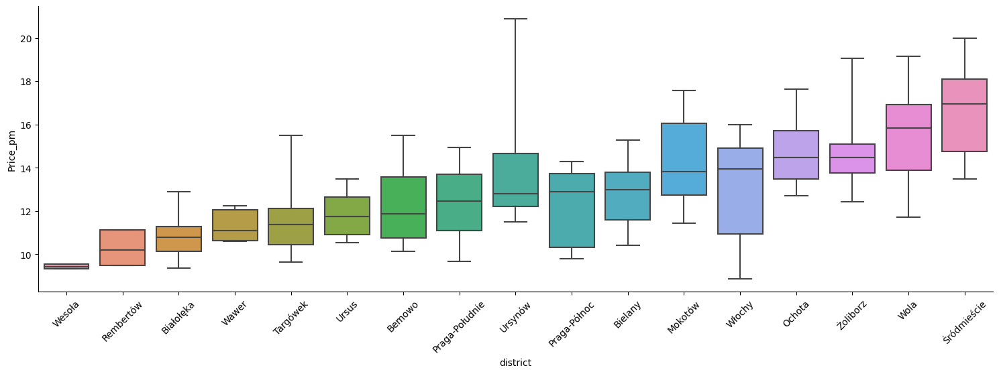

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

ords=zwykle.groupby('district')['Price_pm'].median().sort_values().index
sns.catplot(x='district', y='Price_pm', data=zwykle, kind='box', sym='', whis=[5,95], aspect=3, order=ords)
plt.xticks(rotation=45)

In [21]:
import plotly.express as px
df = px.data.gapminder().query("year==2007")
fig = px.scatter_geo(df, locations="iso_alpha", color="continent",
                     hover_name="country", size="pop",
                     projection="natural earth")
fig.show()

In [22]:

df2=zwykle.groupby('residential')['Price_pm','latitude', 'longitude'].median()
df2['Price_pm']=df2['Price_pm'].round(2)
df2.reset_index(inplace=True)

C:\Users\krawc\AppData\Local\Temp\ipykernel_5820\4088151337.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [23]:
fig = px.scatter_geo(df2, text="Price_pm", lat='latitude', lon='longitude',hover_name="Price_pm", size="Price_pm", projection="natural earth")
fig.update_geos(fitbounds="locations")
# fig.update_geos(
#     visible=False, resolution=50, scope="north america",
#     showcountries=True, countrycolor="Black",
#     showsubunits=True, subunitcolor="Blue"
# )
fig.show()

In [24]:
fig = px.line_mapbox(us_cities, lat="lat", lon="lon", color="State", zoom=3, height=300)

fig.update_layout(mapbox_style="stamen-terrain", mapbox_zoom=4, mapbox_center_lat = 41,
    margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

In [25]:
import plotly.express as px

fig = px.choropleth_mapbox(df2, lat='latitude', lon='longitude', color="Price_pm")
    
    # df, , color="winner",
    #                        locations="district", featureidkey="properties.district",
    #                        center={"lat": 45.5517, "lon": -73.7073},
    #                        mapbox_style="carto-positron", zoom=9)
fig.show()

TypeError: choropleth_mapbox() got an unexpected keyword argument 'lat'

In [ ]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/ppatrzyk/polska-geojson/master/powiaty/powiaty-medium.geojson') as response:
    pow_m = json.load(response)
with urlopen('https://raw.githubusercontent.com/andilabs/warszawa-dzielnice-geojson/master/warszawa-dzielnice.geojson') as response:
    dzi_waw = json.load(response)


In [ ]:
# pow_m['features'][0]['properties']
# {'id': 1, 'nazwa': 'powiat ropczycko-sędziszowski'}
# .keys()
pow_m['features'][3].keys()

dict_keys(['type', 'geometry', 'properties', 'id'])

In [ ]:
pow_m

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'geometry': {'type': 'Polygon',
    'coordinates': [[[21.8034, 50.1514],
      [21.803, 50.1501],
      [21.804, 50.1489],
      [21.8038, 50.148],
      [21.8042, 50.1473],
      [21.8039, 50.1464],
      [21.8045, 50.1454],
      [21.804, 50.1444],
      [21.804, 50.1422],
      [21.8036, 50.1417],
      [21.8033, 50.14],
      [21.8026, 50.1392],
      [21.8015, 50.1386],
      [21.8001, 50.137],
      [21.7994, 50.1359],
      [21.7982, 50.1347],
      [21.7976, 50.1337],
      [21.7965, 50.1325],
      [21.7963, 50.1313],
      [21.7958, 50.1304],
      [21.7958, 50.1291],
      [21.7948, 50.1284],
      [21.7946, 50.1274],
      [21.7947, 50.1256],
      [21.794, 50.1247],
      [21.7933, 50.1233],
      [21.7932, 50.121],
      [21.7925, 50.1198],
      [21.7893, 50.1182],
      [21.7884, 50.1171],
      [21.787, 50.1163],
      [21.7862, 50.1163],
      [21.7845, 50.1155],
      [21.7837, 50.1148],
      [21.779

In [ ]:
MAPBOX_TOKEN="pk.eyJ1IjoibGFjYWJyYTAwIiwiYSI6ImNrc2htaXNyazF2a3cydW41Nml2ZjU1NmsifQ.TX8-R3V34NRBt9gTs2c0dg"
# MAPBOX_TOKEN='pk.eyJ1Ijoid2VudGp1biIsImEiOiJjandmODc5cngwcDJjNDNwYjhtOXZqejVtIn0.1l6XNJgy4pkY7TWEV58pVQ'
import plotly.express as px
px.set_mapbox_access_token(MAPBOX_TOKEN)

fig = px.scatter_mapbox(df2, lat='latitude', lon='longitude', color="Price_pm", size="Price_pm", hover_name="residential",
                  color_continuous_scale=px.colors.sequential.Aggrnyl, size_max=18, zoom=10)

fig.update_layout(mapbox_style="outdoors", margin={"r":0,"t":0,"l":0,"b":0})
# free
#  carto-darkmatter, carto-positron, open-street-map, stamen-terrain, stamen-toner, stamen-watercolor, white-bg 
# token
#  basic, streets, outdoors, light, dark, satellite, satellite-streets
fig.show()

NameError: name 'df2' is not defined

In [6]:
# NO TOKEN
import pandas as pd
us_cities = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/us-cities-top-1k.csv")

import plotly.express as px

fig = px.scatter_mapbox(us_cities, lat="lat", lon="lon", hover_name="City", hover_data=["State", "Population"],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(mapbox_style="stamen-terrain")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.show()
fig.show(renderer="jupyterlab")


In [26]:
df2

,residential,Price_pm,latitude,longitude
0,Bemowo-Lotnisko,11.93,52.256118,20.923412
1,Białołęka Dworska,11.26,52.328990,21.007680
2,Brzeziny,11.24,52.320220,21.032530
3,Bródno,11.29,52.288975,21.035581
4,Bródno-Podgrodzie,11.26,52.298770,21.047140
...,...,...,...,...
80,Wyględów,14.41,52.191990,20.990980
81,Zacisze,12.59,52.288380,21.083114
82,Śródmieście Południowe,20.32,52.223275,21.019887
83,Śródmieście Północne,16.42,52.236140,21.008170


In [2]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

counties["features"][0]

{'type': 'Feature',
 'properties': {'GEO_ID': '0500000US01001',
  'STATE': '01',
  'COUNTY': '001',
  'NAME': 'Autauga',
  'LSAD': 'County',
  'CENSUSAREA': 594.436},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-86.496774, 32.344437],
    [-86.717897, 32.402814],
    [-86.814912, 32.340803],
    [-86.890581, 32.502974],
    [-86.917595, 32.664169],
    [-86.71339, 32.661732],
    [-86.714219, 32.705694],
    [-86.413116, 32.707386],
    [-86.411172, 32.409937],
    [-86.496774, 32.344437]]]},
 'id': '01001'}

In [3]:
import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/fips-unemp-16.csv",
                   dtype={"fips": str})

In [36]:
path=r'C:\Users\krawc\OneDrive\Documents\code\pythons\pandas-projects\osm\my_file2.geojson'
with open(path, encoding='utf-8') as json_data:
    res = json.load(json_data)
res
for feat in res['features']:
    feat['id']=feat['properties']['name']


In [37]:
[x['properties']['name'] for x in res['features']]


['Gocław',
 'Przyczółek Grochowski',
 'Szmulowizna',
 'Stara Praga',
 'Anin',
 'Sadul',
 'Kawęczyn-Wygoda',
 'Wesoła-Centrum',
 'Utrata',
 'Elsnerów',
 'Targówek Fabryczny',
 'Białołęka Dworska',
 'Kobiałka',
 'Kępa Zawadowska',
 'Wilanów Królewski',
 'Las',
 'Boernerowo',
 'Nowe Miasto',
 'Wilanów Niski',
 'Wilanów Wysoki',
 'Muranów',
 'Śródmieście Północne',
 'Powiśle',
 'Solec',
 'Śródmieście Południowe',
 'Młynów',
 'Nowolipki',
 'Marymont-Potok',
 'Powązki',
 'Powsinek',
 'Stary Służew',
 'Ujazdów',
 'Czerniaków',
 'Sielce',
 'Szamoty',
 'Czechowice',
 'Niedźwiadek',
 'Gołąbki',
 'Targówek Mieszkaniowy',
 'Augustówka',
 'Sadyba',
 'Stegny',
 'Wierzbno',
 'Stary Mokotów',
 'Ksawerów',
 'Szczęśliwice',
 'Rakowiec',
 'Stara Ochota',
 'Filtry',
 'Czyste',
 'Mirów',
 'Powsin',
 'Skarpa Powsińska',
 'Teren Wydzielony Rezerwat "Las Kabacki"',
 'Pyry',
 'Stary Imielin',
 'Błonia Wilanowskie',
 'Wyczółki',
 'Służewiec',
 'Zbarż',
 'Wyględów',
 'Paluch',
 'Załuski',
 'Okęcie',
 'Nowe Włoch

In [48]:
import plotly.express as px

fig = px.choropleth_mapbox(df2, geojson=res, locations='residential', color='Price_pm',
                           color_continuous_scale="Viridis",
                           range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=9,
                           opacity=0.5,
                           center = {"lat": 52.25, "lon": 21},
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.update_geos(fitbounds="geojson")
fig.show()